<a href="https://colab.research.google.com/github/Sugitha-Rao/machine-learning-projects/blob/main/05_transferlearning_fine_tuning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:

import tensorflow as tf

print(f"TensorFlow version: {tf.__version__}")

TensorFlow version: 2.20.0


In [2]:

# Are we using a GPU? (if not & you're using Google Colab, go to Runtime -> Change Runtime Type -> Harware Accelerator: GPU )
!nvidia-smi

Mon Sep 14 15:08:32 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   45C    P8             11W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

## Import helper functions

In [3]:

# Get helper_functions.py script from course GitHub
!wget https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/refs/heads/main/extras/helper_functions.py

# Import helper functions we're going to use
from helper_functions import create_tensorboard_callback, plot_loss_curves, unzip_data, walk_through_dir

--2026-09-14 15:08:32--  https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/refs/heads/main/extras/helper_functions.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.111.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 10246 (10K) [text/plain]
Saving to: ‘helper_functions.py’

helper_functions.py 100%[===================>]  10.01K  --.-KB/s    in 0s      

2026-09-14 15:08:32 (106 MB/s) - ‘helper_functions.py’ saved [10246/10246]



In [4]:

# Get 10% of the data of the 10 classes
!wget https://storage.googleapis.com/ztm_tf_course/food_vision/10_food_classes_10_percent.zip

unzip_data("10_food_classes_10_percent.zip")

--2026-09-14 15:08:33--  https://storage.googleapis.com/ztm_tf_course/food_vision/10_food_classes_10_percent.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 104.154.125.27, 34.3.0.27, 34.153.3.27, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|104.154.125.27|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 168546183 (161M) [application/zip]
Saving to: ‘10_food_classes_10_percent.zip’

10_food_classes_10_ 100%[===================>] 160.74M  71.0MB/s    in 2.3s    

2026-09-14 15:08:36 (71.0 MB/s) - ‘10_food_classes_10_percent.zip’ saved [168546183/168546183]



In [5]:
# Walk through 10 percent data directory and list number of files
walk_through_dir("10_food_classes_10_percent")

There are 2 directories and 0 images in '10_food_classes_10_percent'.
There are 10 directories and 0 images in '10_food_classes_10_percent/test'.
There are 0 directories and 250 images in '10_food_classes_10_percent/test/chicken_wings'.
There are 0 directories and 250 images in '10_food_classes_10_percent/test/pizza'.
There are 0 directories and 250 images in '10_food_classes_10_percent/test/sushi'.
There are 0 directories and 250 images in '10_food_classes_10_percent/test/ice_cream'.
There are 0 directories and 250 images in '10_food_classes_10_percent/test/hamburger'.
There are 0 directories and 250 images in '10_food_classes_10_percent/test/steak'.
There are 0 directories and 250 images in '10_food_classes_10_percent/test/chicken_curry'.
There are 0 directories and 250 images in '10_food_classes_10_percent/test/grilled_salmon'.
There are 0 directories and 250 images in '10_food_classes_10_percent/test/ramen'.
There are 0 directories and 250 images in '10_food_classes_10_percent/test

In [6]:

# Create training and test directories
train_dir = "10_food_classes_10_percent/train/"
test_dir = "10_food_classes_10_percent/test/"

In [7]:
# Create data inputs
import tensorflow as tf
IMG_SIZE = (224, 224) # define image size

train_data_10_percent = tf.keras.preprocessing.image_dataset_from_directory(directory=train_dir,
                                                                            image_size=IMG_SIZE,
                                                                            label_mode="categorical", # what type are the labels?
                                                                            batch_size=32) # batch_size is 32 by default, this is generally a good number
test_data_10_percent = tf.keras.preprocessing.image_dataset_from_directory(directory=test_dir,
                                                                           image_size=IMG_SIZE,
                                                                           label_mode="categorical")

Found 750 files belonging to 10 classes.
Found 2500 files belonging to 10 classes.


In [8]:
train_data_10_percent

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 10), dtype=tf.float32, name=None))>

# Model_0 - Build TF using keras functional API

In [9]:
# Create base model
base_model = tf.keras.applications.efficientnet_v2.EfficientNetV2B0(include_top=False)

# Make base model as non-trainable
base_model.trainable = False

#Create inputs to the base model
inputs = tf.keras.layers.Input(shape = (224,224,3), name = "input_layer")

#pass the inputs to base model
x = base_model(inputs)
# Check data shape after passing it to base_model
print(f"Shape after base_model: {x.shape}")

# Average Pool
x = tf.keras.layers.GlobalAveragePooling2D(name = 'globalaveragelayer')(x)
print(f"Shape after GlobalAveragePooling2D: {x.shape}")

#outputs
output = tf.keras.layers.Dense(10, activation='softmax', name="output_layer")(x)

#combine inputs and outputs
model_0 = tf.keras.Model(inputs, output)

# comiple the model
model_0.compile(loss='categorical_crossentropy',
              optimizer=tf.keras.optimizers.Adam(),
              metrics=["accuracy"])

# Model summary
model_0.summary()

#Fit the model
history_10_percent = model_0.fit(train_data_10_percent,
                                 epochs=5,
                                 steps_per_epoch=len(train_data_10_percent),
                                 validation_data=test_data_10_percent,
                                 # Go through less of the validation data so epochs are faster (we want faster experiments!)
                                 validation_steps=int(0.25 * len(test_data_10_percent)),
                                 # Track our model's training logs for visualization later
                                 callbacks=[create_tensorboard_callback("transfer_learning", "10_percent_feature_extract")])

24274472/24274472 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Shape after base_model: (None, 7, 7, 1280)
Shape after GlobalAveragePooling2D: (None, 1280)


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetv2-b0 (Functional)  │ (None, 7, 7, 1280)     │     5,919,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ globalaveragelayer              │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output_layer (Dense)            │ (None, 10)             │        12,810 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 5,932,122 (22.63 MB)

 Trainable params: 12,810 (50.04 KB)

 Non-trainable params: 5,919,312 (22.58 MB)

Saving TensorBoard log files to: transfer_learning/10_percent_feature_extract/20260914-150844
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 58s 1s/step - accuracy: 0.4427 - loss: 1.8208 - val_accuracy: 0.7533 - val_loss: 1.3060
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 7s 317ms/step - accuracy: 0.7587 - loss: 1.1153 - val_accuracy: 0.8109 - val_loss: 0.8738
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 4s 145ms/step - accuracy: 0.8227 - loss: 0.8102 - val_accuracy: 0.8503 - val_loss: 0.7027
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 5s 206ms/step - accuracy: 0.8493 - loss: 0.6751 - val_accuracy: 0.8536 - val_loss: 0.6399
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - accuracy: 0.8707 - loss: 0.5916 - val_accuracy: 0.8602 - val_loss: 0.5556


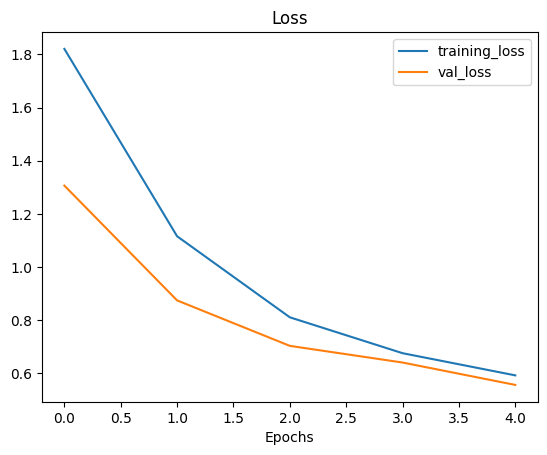

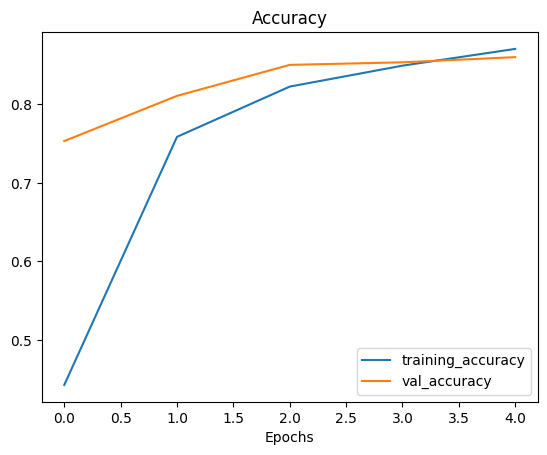

In [10]:
# Check out our model's training curves
plot_loss_curves(history_10_percent)

## Create Model_1 with 1per data and Augmentation

In [11]:

# Download and unzip data
!wget https://storage.googleapis.com/ztm_tf_course/food_vision/10_food_classes_1_percent.zip
unzip_data("10_food_classes_1_percent.zip")

# Create training and test dirs
train_dir_1_percent = "10_food_classes_1_percent/train/"
test_dir = "10_food_classes_1_percent/test/"

--2026-09-14 15:10:01--  https://storage.googleapis.com/ztm_tf_course/food_vision/10_food_classes_1_percent.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 34.144.170.27, 34.153.3.27, 34.153.2.27, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|34.144.170.27|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 133612354 (127M) [application/zip]
Saving to: ‘10_food_classes_1_percent.zip’

10_food_classes_1_p 100%[===================>] 127.42M   169MB/s    in 0.8s    

2026-09-14 15:10:02 (169 MB/s) - ‘10_food_classes_1_percent.zip’ saved [133612354/133612354]



In [12]:

# Walk through 1 percent data directory and list number of files
walk_through_dir("10_food_classes_1_percent")

There are 2 directories and 0 images in '10_food_classes_1_percent'.
There are 10 directories and 0 images in '10_food_classes_1_percent/test'.
There are 0 directories and 250 images in '10_food_classes_1_percent/test/chicken_wings'.
There are 0 directories and 250 images in '10_food_classes_1_percent/test/pizza'.
There are 0 directories and 250 images in '10_food_classes_1_percent/test/sushi'.
There are 0 directories and 250 images in '10_food_classes_1_percent/test/ice_cream'.
There are 0 directories and 250 images in '10_food_classes_1_percent/test/hamburger'.
There are 0 directories and 250 images in '10_food_classes_1_percent/test/steak'.
There are 0 directories and 250 images in '10_food_classes_1_percent/test/chicken_curry'.
There are 0 directories and 250 images in '10_food_classes_1_percent/test/grilled_salmon'.
There are 0 directories and 250 images in '10_food_classes_1_percent/test/ramen'.
There are 0 directories and 250 images in '10_food_classes_1_percent/test/fried_rice'

In [13]:

import tensorflow as tf
IMG_SIZE = (224, 224)
train_data_1_percent = tf.keras.preprocessing.image_dataset_from_directory(train_dir_1_percent,
                                                                           label_mode="categorical",
                                                                           batch_size=32, # default
                                                                           image_size=IMG_SIZE)
test_data = tf.keras.preprocessing.image_dataset_from_directory(test_dir,
                                                                label_mode="categorical",
                                                                image_size=IMG_SIZE)


Found 70 files belonging to 10 classes.
Found 2500 files belonging to 10 classes.


### Data Augmentation

In [14]:

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import numpy as np
# from tensorflow.keras.layers.experimental import preprocessing

# NEW: Newer versions of TensorFlow (2.10+) can use the tensorflow.keras.layers API directly for data augmentation
data_augmentation = keras.Sequential([
  layers.RandomFlip("horizontal"),
  layers.RandomRotation(0.2),
  layers.RandomZoom(0.2),
  layers.RandomHeight(0.2),
  layers.RandomWidth(0.2),
  # preprocessing.Rescaling(1./255) # keep for ResNet50V2, remove for EfficientNetV2B0
], name ="data_augmentation")

In [15]:
# Get the first batch of images and labels
for images, labels in train_data_1_percent.take(1):
	example_batch_images = images
	example_batch_labels = labels

print(f"Maximum pixel value of images: {np.max(example_batch_images)}\n")
print(f"Shape of batch of images: {example_batch_images.shape}")
print(f"Shape of batch of labels: {example_batch_labels.shape}")

Maximum pixel value of images: 255.0

Shape of batch of images: (32, 224, 224, 3)
Shape of batch of labels: (32, 10)


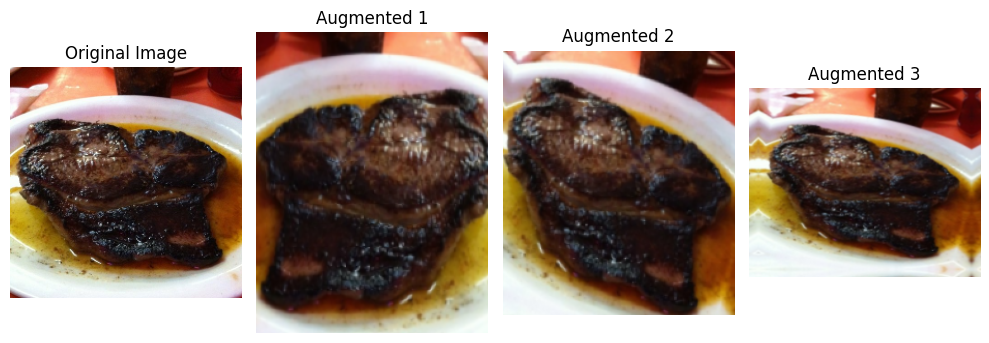

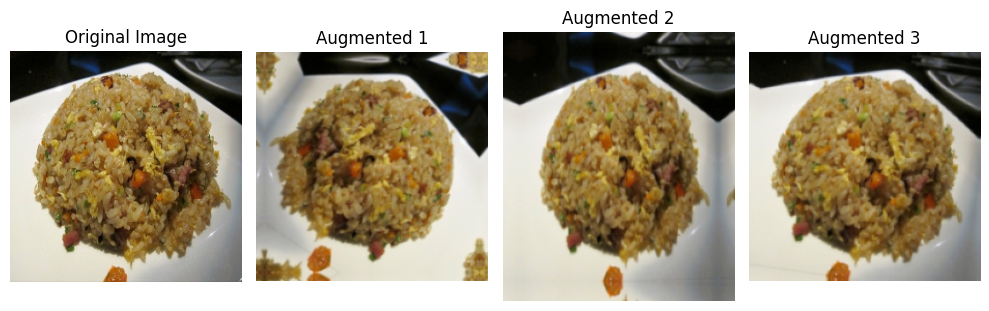

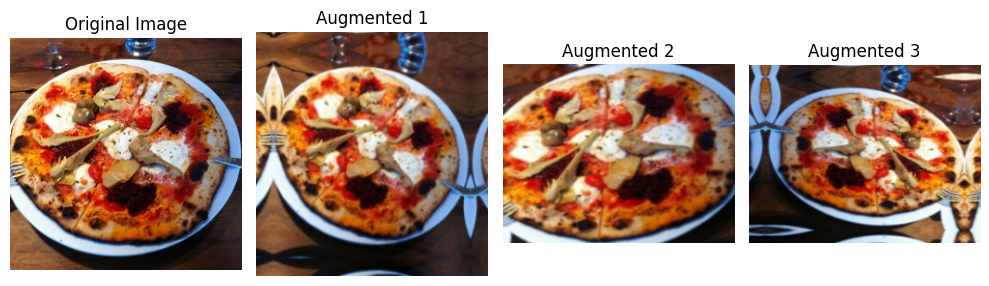

In [16]:
import matplotlib.pyplot as plt
import tensorflow as tf

for j in range(3):
    # 1. Convert to array and scale to [0, 1] float range
    sample_image = tf.keras.utils.img_to_array(example_batch_images[j]) / 255.0
    images = [sample_image]

    # 2. Apply data augmentation
    for _ in range(3):
        # Add batch dim -> apply augmentation -> squeeze batch dim back
        augmented_tensor = data_augmentation(tf.expand_dims(sample_image, axis=0))
        augmented_image = tf.squeeze(augmented_tensor, axis=0)

        # Ensure augmented output remains clipped in valid [0, 1] display range
        augmented_image = tf.clip_by_value(augmented_image, 0.0, 1.0)
        images.append(augmented_image.numpy())

    # 3. Plot Original vs Augmented
    fig, axs = plt.subplots(1, 4, figsize=(10, 4))
    titles = ['Original Image', 'Augmented 1', 'Augmented 2', 'Augmented 3']

    for ax, img, title in zip(axs, images, titles):
        ax.imshow(img, cmap='gray')
        ax.set_title(title)
        ax.axis('off')

    plt.tight_layout()
    plt.show()

In [17]:
## Feature extraction and learing on Top 1percent


input_shape = (224, 224, 3)
base_model = tf.keras.applications.efficientnet_v2.EfficientNetV2B0(include_top=False)

#Create inputs to the base model
inputs = tf.keras.layers.Input(shape = input_shape, name = "input_layer")

# Add Augmentation layer
x = data_augmentation(inputs)

#pass the inputs to base model and trainable as set to false
x = base_model(x, training=False)

# Average Pool
x = tf.keras.layers.GlobalAveragePooling2D(name = 'globalaveragelayer')(x)

#outputs
output = tf.keras.layers.Dense(10, activation='softmax', name="output_layer")(x)

#combine inputs and outputs
model_1 = tf.keras.Model(inputs, output)

# comiple the model
model_1.compile(loss='categorical_crossentropy',
              optimizer=tf.keras.optimizers.Adam(),
              metrics=["accuracy"])

# Model summary
model_1.summary()

#Fit the model
history_1_percent = model_1.fit(train_data_1_percent,
                                 epochs=5,
                                 steps_per_epoch=len(train_data_1_percent),
                                 validation_data=train_data_1_percent,
                                 # Go through less of the validation data so epochs are faster (we want faster experiments!)
                                 validation_steps=int(0.25 * len(test_data)),
                                 # Track our model's training logs for visualization later
                                 callbacks=[create_tensorboard_callback("transfer_learning", "1_percent_data_aug")])

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ data_augmentation (Sequential)  │ (None, None, None, 3)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetv2-b0 (Functional)  │ (None, None, None,     │     5,919,312 │
│                                 │ 1280)                  │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ globalaveragelayer              │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output_layer (Dense)            │ (None, 10)             │        12,810 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 5,932,122 (22.63 MB)

 Trainable params: 5,871,514 (22.40 MB)

 Non-trainable params: 60,608 (236.75 KB)

Saving TensorBoard log files to: transfer_learning/1_percent_data_aug/20260914-151008
Epoch 1/5
3/3 ━━━━━━━━━━━━━━━━━━━━ 50s 3s/step - accuracy: 0.1714 - loss: 2.2552 - val_accuracy: 0.5714 - val_loss: 1.6706
Epoch 2/5


/usr/local/lib/python3.13/dist-packages/keras/src/trainers/epoch_iterator.py:116: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step - accuracy: 0.8143 - loss: 1.5123 - val_accuracy: 0.8571 - val_loss: 1.1799
Epoch 3/5
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 974ms/step - accuracy: 0.9000 - loss: 1.0417 - val_accuracy: 0.9000 - val_loss: 0.7313
Epoch 4/5
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 953ms/step - accuracy: 0.9571 - loss: 0.7179 - val_accuracy: 0.9429 - val_loss: 0.4380
Epoch 5/5
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 916ms/step - accuracy: 0.9857 - loss: 0.3498 - val_accuracy: 0.9571 - val_loss: 0.2431


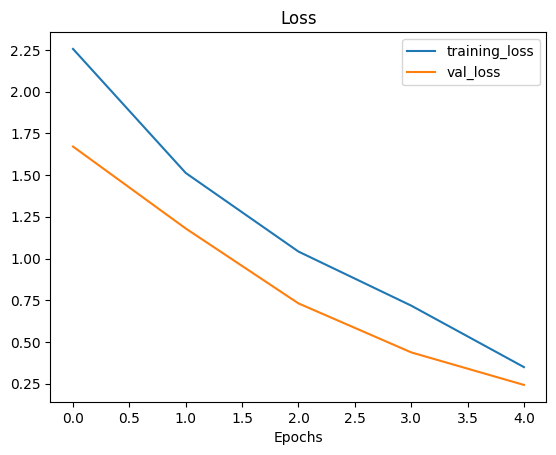

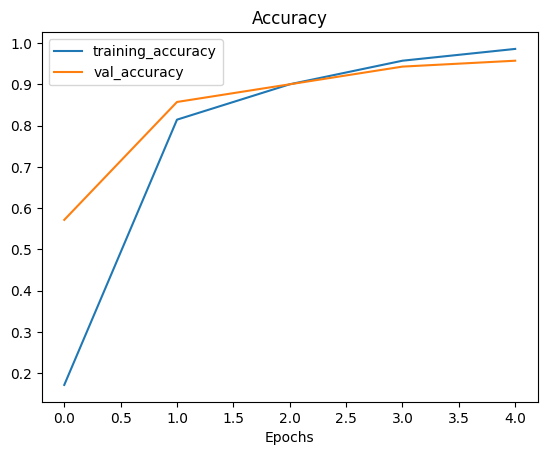

In [18]:
# Check out our model's training curves
plot_loss_curves(history_1_percent)

Model_2 Transfer Learning with data_aug and 10% train set
- model checkpoint

In [19]:
## Feature extraction and learing on Top 10 percent


input_shape = (224, 224, 3)
base_model = tf.keras.applications.efficientnet_v2.EfficientNetV2B0(include_top=False)
base_model.trainable = False

#Create inputs to the base model
inputs = tf.keras.layers.Input(shape = input_shape, name = "input_layer")

# Add Augmentation layer
x = data_augmentation(inputs)

#pass the inputs to base model and trainable as set to false
x = base_model(x, training=False)

# Average Pool
x = tf.keras.layers.GlobalAveragePooling2D(name = 'globalaveragelayer')(x)

#outputs
output = tf.keras.layers.Dense(10, activation='softmax', name="output_layer")(x)

#combine inputs and outputs
model_2 = tf.keras.Model(inputs, output)

# comiple the model
model_2.compile(loss='categorical_crossentropy',
              optimizer=tf.keras.optimizers.Adam(learning_rate = 0.001),
              metrics=["accuracy"])

# Model summary
model_2.summary()

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ data_augmentation (Sequential)  │ (None, None, None, 3)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetv2-b0 (Functional)  │ (None, None, None,     │     5,919,312 │
│                                 │ 1280)                  │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ globalaveragelayer              │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output_layer (Dense)            │ (None, 10)             │        12,810 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 5,932,122 (22.63 MB)

 Trainable params: 12,810 (50.04 KB)

 Non-trainable params: 5,919,312 (22.58 MB)

In [20]:
## Create model checkpoint for either saving model or saving weights

import tensorflow as tf

# 1. Update file extension to .weights.h5 for Keras 3 compatibility
checkpoint_path = "ten_percent_model_checkpoints_weights/checkpoint.weights.h5"

# 2. Define the callback
checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_path,
    save_weights_only=True,
    save_best_only=True,
    monitor="val_accuracy",  # Monitors validation accuracy to save the best weights
    mode="max",
    save_freq="epoch",
    verbose=1
)

In [21]:
# Fit the model saving checkpoints every epoch
initial_epochs = 5
history_10_percent_data_aug = model_2.fit(train_data_10_percent,
                                          epochs=initial_epochs,
                                          validation_data=test_data_10_percent,
                                          validation_steps=int(0.25 * len(test_data_10_percent)), # do less steps per validation (quicker)
                                          callbacks=[create_tensorboard_callback("transfer_learning", "10_percent_data_aug"),
                                                     checkpoint_callback])

Saving TensorBoard log files to: transfer_learning/10_percent_data_aug/20260914-151112
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step - accuracy: 0.1964 - loss: 2.2325
Epoch 1: val_accuracy improved from None to 0.59868, saving model to ten_percent_model_checkpoints_weights/checkpoint.weights.h5

Epoch 1: finished saving model to ten_percent_model_checkpoints_weights/checkpoint.weights.h5
24/24 ━━━━━━━━━━━━━━━━━━━━ 25s 548ms/step - accuracy: 0.2947 - loss: 2.0567 - val_accuracy: 0.5987 - val_loss: 1.5824
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step - accuracy: 0.5820 - loss: 1.5876
Epoch 2: val_accuracy improved from 0.59868 to 0.75164, saving model to ten_percent_model_checkpoints_weights/checkpoint.weights.h5

Epoch 2: finished saving model to ten_percent_model_checkpoints_weights/checkpoint.weights.h5
24/24 ━━━━━━━━━━━━━━━━━━━━ 10s 420ms/step - accuracy: 0.6200 - loss: 1.4878 - val_accuracy: 0.7516 - val_loss: 1.1191
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step - acc

In [22]:
results_10_per_data_aug = model_2.evaluate(test_data_10_percent)
results_10_per_data_aug

79/79 ━━━━━━━━━━━━━━━━━━━━ 6s 80ms/step - accuracy: 0.8196 - loss: 0.6891


[0.6891133189201355, 0.819599986076355]

In [23]:
model_2.load_weights(checkpoint_path)
loaded_weights_model_results = model_2.evaluate(test_data_10_percent)

79/79 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step - accuracy: 0.8196 - loss: 0.6891


In [24]:
# If the results from our native model and the loaded weights are the same, this should output True
results_10_per_data_aug == loaded_weights_model_results

False

In [25]:

# Check the difference between the two results (small values)
print(np.array(results_10_per_data_aug) - np.array(loaded_weights_model_results))

[-5.96046448e-08  0.00000000e+00]


In [26]:

import numpy as np
# Check to see if loaded model results are very close to native model results (should output True)
np.isclose(np.array(results_10_per_data_aug), np.array(loaded_weights_model_results))


array([ True,  True])

# Model 3: Fine-tuning an existing model on 10% of the data

In [27]:

# Layers in loaded model
model_2.layers

[<InputLayer name=input_layer, built=True>,
 <Sequential name=data_augmentation, built=True>,
 <Functional name=efficientnetv2-b0, built=True>,
 <GlobalAveragePooling2D name=globalaveragelayer, built=True>,
 <Dense name=output_layer, built=True>]

In [28]:
for i , layer in enumerate(model_2.layers):
    print(f"Layer number: {i} || Layer name: {layer.name} ||  Layer Type: {layer} || Trainable? {layer.trainable}")

Layer number: 0 || Layer name: input_layer ||  Layer Type: <InputLayer name=input_layer, built=True> || Trainable? True
Layer number: 1 || Layer name: data_augmentation ||  Layer Type: <Sequential name=data_augmentation, built=True> || Trainable? True
Layer number: 2 || Layer name: efficientnetv2-b0 ||  Layer Type: <Functional name=efficientnetv2-b0, built=True> || Trainable? False
Layer number: 3 || Layer name: globalaveragelayer ||  Layer Type: <GlobalAveragePooling2D name=globalaveragelayer, built=True> || Trainable? True
Layer number: 4 || Layer name: output_layer ||  Layer Type: <Dense name=output_layer, built=True> || Trainable? True


In [29]:
# How many layers are trainable in our model_2_base_model?
print(len(model_2.layers[2].trainable_variables))

0


In [30]:
# Check which layers are tuneable (trainable)
for layer_number, layer in enumerate(model_2.layers[2].layers):
  print(layer_number, layer.name, layer.trainable)

0 input_layer_3 False
1 rescaling_2 False
2 normalization_2 False
3 stem_conv False
4 stem_bn False
5 stem_activation False
6 block1a_project_conv False
7 block1a_project_bn False
8 block1a_project_activation False
9 block2a_expand_conv False
10 block2a_expand_bn False
11 block2a_expand_activation False
12 block2a_project_conv False
13 block2a_project_bn False
14 block2b_expand_conv False
15 block2b_expand_bn False
16 block2b_expand_activation False
17 block2b_project_conv False
18 block2b_project_bn False
19 block2b_drop False
20 block2b_add False
21 block3a_expand_conv False
22 block3a_expand_bn False
23 block3a_expand_activation False
24 block3a_project_conv False
25 block3a_project_bn False
26 block3b_expand_conv False
27 block3b_expand_bn False
28 block3b_expand_activation False
29 block3b_project_conv False
30 block3b_project_bn False
31 block3b_drop False
32 block3b_add False
33 block4a_expand_conv False
34 block4a_expand_bn False
35 block4a_expand_activation False
36 block4a_dw

In [31]:
model_2.layers[2].trainable = True

## Make last 10 layers trainable
for layer in model_2.layers[2].layers[:-10]:
    layer.trainable = False

## Recompile the model
model_2.compile(loss="categorical_crossentropy",
                optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
                metrics=["accuracy"])

In [32]:
# How many layers are trainable in our model_2_base_model?
print(len(model_2.trainable_variables))

12


In [33]:
model_2.summary()

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ data_augmentation (Sequential)  │ (None, None, None, 3)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetv2-b0 (Functional)  │ (None, None, None,     │     5,919,312 │
│                                 │ 1280)                  │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ globalaveragelayer              │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output_layer (Dense)            │ (None, 10)             │        12,810 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 5,932,122 (22.63 MB)

 Trainable params: 594,490 (2.27 MB)

 Non-trainable params: 5,337,632 (20.36 MB)

In [34]:
# Fine tune for another 5 epochs
fine_tune_epochs = initial_epochs + 5

# Refit the model (same as model_2 except with more trainable layers)
history_fine_10_percent_data_aug = model_2.fit(train_data_10_percent,
                                               epochs=fine_tune_epochs,
                                               validation_data=test_data_10_percent,
                                               initial_epoch=history_10_percent_data_aug.epoch[-1], # start from previous last epoch
                                               validation_steps=int(0.25 * len(test_data_10_percent)),
                                               callbacks=[create_tensorboard_callback("transfer_learning", "10_percent_fine_tune_last_10")])

Saving TensorBoard log files to: transfer_learning/10_percent_fine_tune_last_10/20260914-151229
Epoch 5/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 23s 469ms/step - accuracy: 0.7347 - loss: 1.0309 - val_accuracy: 0.8339 - val_loss: 0.7240
Epoch 6/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 18s 386ms/step - accuracy: 0.7787 - loss: 0.8874 - val_accuracy: 0.8372 - val_loss: 0.6614
Epoch 7/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 8s 338ms/step - accuracy: 0.8093 - loss: 0.8485 - val_accuracy: 0.8438 - val_loss: 0.5896
Epoch 8/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 10s 340ms/step - accuracy: 0.8067 - loss: 0.8161 - val_accuracy: 0.8487 - val_loss: 0.5613
Epoch 9/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 8s 337ms/step - accuracy: 0.8093 - loss: 0.7441 - val_accuracy: 0.8405 - val_loss: 0.5326
Epoch 10/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 7s 299ms/step - accuracy: 0.8147 - loss: 0.7154 - val_accuracy: 0.8454 - val_loss: 0.5333


In [35]:
def compare_historys(original_history, new_history, initial_epochs=5):
    """
    Compares two model history objects.
    """
    # Get original history measurements
    acc = original_history.history["accuracy"]
    loss = original_history.history["loss"]

    print(len(acc))

    val_acc = original_history.history["val_accuracy"]
    val_loss = original_history.history["val_loss"]

    # Combine original history with new history
    total_acc = acc + new_history.history["accuracy"]
    total_loss = loss + new_history.history["loss"]

    total_val_acc = val_acc + new_history.history["val_accuracy"]
    total_val_loss = val_loss + new_history.history["val_loss"]

    print(len(total_acc))
    print(total_acc)

    # Make plots
    plt.figure(figsize=(8, 8))
    plt.subplot(2, 1, 1)
    plt.plot(total_acc, label='Training Accuracy')
    plt.plot(total_val_acc, label='Validation Accuracy')
    plt.plot([initial_epochs-1, initial_epochs-1],
              plt.ylim(), label='Start Fine Tuning') # reshift plot around epochs
    plt.legend(loc='lower right')
    plt.title('Training and Validation Accuracy')

    plt.subplot(2, 1, 2)
    plt.plot(total_loss, label='Training Loss')
    plt.plot(total_val_loss, label='Validation Loss')
    plt.plot([initial_epochs-1, initial_epochs-1],
              plt.ylim(), label='Start Fine Tuning') # reshift plot around epochs
    plt.legend(loc='upper right')
    plt.title('Training and Validation Loss')
    plt.xlabel('epoch')
    plt.show()

5
11
[0.29466667771339417, 0.6200000047683716, 0.6933333277702332, 0.7493333220481873, 0.7799999713897705, 0.734666645526886, 0.7786666750907898, 0.809333324432373, 0.8066666722297668, 0.809333324432373, 0.8146666884422302]


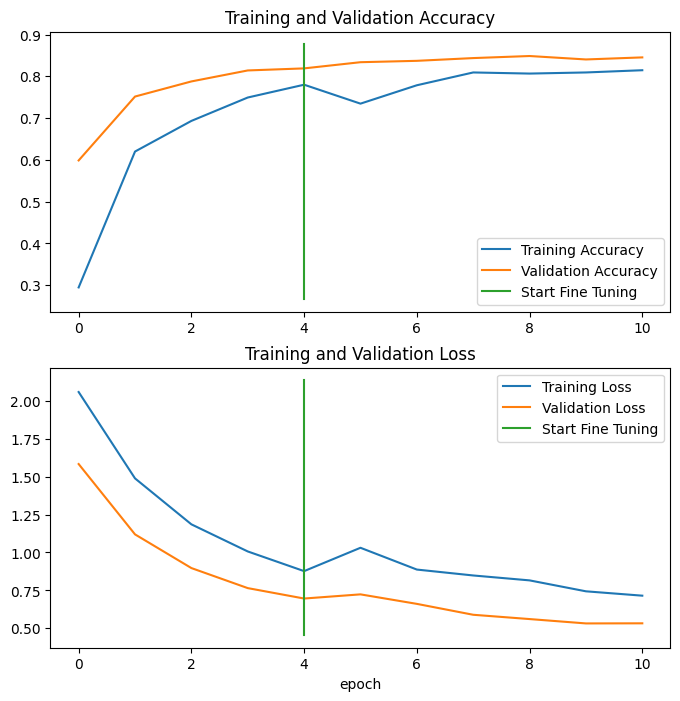

In [36]:
compare_historys(original_history=history_10_percent_data_aug,
                 new_history=history_fine_10_percent_data_aug,
                 initial_epochs=5)

In [37]:
results_fine_tune_10_percent = model_2.evaluate(test_data_10_percent)
results_fine_tune_10_percent

79/79 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step - accuracy: 0.8488 - loss: 0.5189


[0.518875002861023, 0.848800003528595]

# Model_4 - load Full data

In [38]:

# Download and unzip 10 classes of data with all images
!wget https://storage.googleapis.com/ztm_tf_course/food_vision/10_food_classes_all_data.zip
unzip_data("10_food_classes_all_data.zip")

# Setup data directories
train_dir = "10_food_classes_all_data/train/"
test_dir = "10_food_classes_all_data/test/"

--2026-09-14 15:13:52--  https://storage.googleapis.com/ztm_tf_course/food_vision/10_food_classes_all_data.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 34.144.170.27, 34.144.171.27, 34.153.3.27, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|34.144.170.27|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 519183241 (495M) [application/zip]
Saving to: ‘10_food_classes_all_data.zip’

10_food_classes_all 100%[===================>] 495.13M  47.7MB/s    in 11s     

2026-09-14 15:14:03 (47.1 MB/s) - ‘10_food_classes_all_data.zip’ saved [519183241/519183241]



In [39]:

# Setup data inputs
import tensorflow as tf
IMG_SIZE = (224, 224)
train_data_10_classes_full = tf.keras.preprocessing.image_dataset_from_directory(train_dir,
                                                                                 label_mode="categorical",
                                                                                 image_size=IMG_SIZE)

# Note: this is the same test dataset we've been using for the previous modelling experiments
test_data_10_classes_full = tf.keras.preprocessing.image_dataset_from_directory(test_dir,
                                                                label_mode="categorical",
                                                                image_size=IMG_SIZE)

Found 7500 files belonging to 10 classes.
Found 2500 files belonging to 10 classes.


In [40]:
# Evaluate model (this is the fine-tuned 10 percent of data version)
model_2.evaluate(test_data_10_classes_full)

79/79 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step - accuracy: 0.8488 - loss: 0.5189


[0.518875002861023, 0.848800003528595]

In [41]:
model_2.load_weights(checkpoint_path)
model_2.evaluate(test_data_10_classes_full)

 2/79 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - accuracy: 0.8125 - loss: 0.7245 

/usr/local/lib/python3.13/dist-packages/keras/src/saving/saving_lib.py:797: UserWarning: Skipping variable loading for optimizer 'adam', because it has 26 variables whereas the saved optimizer has 6 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


79/79 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - accuracy: 0.8196 - loss: 0.6891


[0.6891133189201355, 0.819599986076355]

In [42]:
def create_base_model(input_shape: tuple[int, int, int] = (224, 224, 3),
                      output_shape: int = 10,
                      learning_rate: float = 0.001,
                      training: bool = False) -> tf.keras.Model:
    """
    Create a model based on EfficientNetV2B0 with built-in data augmentation.

    Parameters:
    - input_shape (tuple): Expected shape of input images. Default is (224, 224, 3).
    - output_shape (int): Number of classes for the output layer. Default is 10.
    - learning_rate (float): Learning rate for the Adam optimizer. Default is 0.001.
    - training (bool): Whether the base model is trainable. Default is False.

    Returns:
    - tf.keras.Model: The compiled model with specified input and output settings.
    """

    # Create base model
    base_model = tf.keras.applications.efficientnet_v2.EfficientNetV2B0(include_top=False)
    base_model.trainable = training

    # Setup model input and outputs with data augmentation built-in
    inputs = layers.Input(shape=input_shape, name="input_layer")
    x = data_augmentation(inputs)
    x = base_model(x, training=False)  # pass augmented images to base model but keep it in inference mode
    x = layers.GlobalAveragePooling2D(name="global_average_pooling_layer")(x)
    outputs = layers.Dense(units=output_shape, activation="softmax", name="output_layer")(x)
    model = tf.keras.Model(inputs, outputs)

    # Compile model
    model.compile(loss="categorical_crossentropy",
                  optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
                  metrics=["accuracy"])

    return model

# Create an instance of model_2 with our new function
model_2 = create_base_model()

In [43]:

# Create a new instance of model_2 for Experiment 4
model_2 = create_base_model(learning_rate=0.0001) # 10x lower learning rate for fine-tuning

In [44]:
model_2.load_weights(checkpoint_path)
model_2.evaluate(test_data_10_classes_full)

/usr/local/lib/python3.13/dist-packages/keras/src/saving/saving_lib.py:797: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 6 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


79/79 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.8196 - loss: 0.6891


[0.6891135573387146, 0.819599986076355]

In [46]:

# Unfreeze the top 10 layers in model_2's base_model
model_2_base_model = model_2.layers[2]
model_2_base_model.trainable = True

# Freeze all layers except for the last 10
for layer in model_2_base_model.layers[:-10]:
  layer.trainable = False

In [47]:

# Check which layers are tuneable in the base model
for layer_number, layer in enumerate(model_2_base_model.layers):
  print(layer_number, layer.name, layer.trainable)

0 input_layer_5 False
1 rescaling_4 False
2 normalization_4 False
3 stem_conv False
4 stem_bn False
5 stem_activation False
6 block1a_project_conv False
7 block1a_project_bn False
8 block1a_project_activation False
9 block2a_expand_conv False
10 block2a_expand_bn False
11 block2a_expand_activation False
12 block2a_project_conv False
13 block2a_project_bn False
14 block2b_expand_conv False
15 block2b_expand_bn False
16 block2b_expand_activation False
17 block2b_project_conv False
18 block2b_project_bn False
19 block2b_drop False
20 block2b_add False
21 block3a_expand_conv False
22 block3a_expand_bn False
23 block3a_expand_activation False
24 block3a_project_conv False
25 block3a_project_bn False
26 block3b_expand_conv False
27 block3b_expand_bn False
28 block3b_expand_activation False
29 block3b_project_conv False
30 block3b_project_bn False
31 block3b_drop False
32 block3b_add False
33 block4a_expand_conv False
34 block4a_expand_bn False
35 block4a_expand_activation False
36 block4a_dw

In [48]:
# Recompile the model (always recompile after any adjustments to a model)
model_2.compile(loss="categorical_crossentropy",
                optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), # lr is 10x lower than before for fine-tuning
                metrics=["accuracy"])

In [49]:
# Continue to train and fine-tune the model to our data
fine_tune_epochs = initial_epochs + 5

history_fine_10_classes_full = model_2.fit(train_data_10_classes_full,
                                           epochs=fine_tune_epochs,
                                           initial_epoch=history_10_percent_data_aug.epoch[-1],
                                           validation_data=test_data_10_classes_full,
                                           validation_steps=int(0.25 * len(test_data_10_classes_full)),
                                           callbacks=[create_tensorboard_callback("transfer_learning", "full_10_classes_fine_tune_last_10")])

Saving TensorBoard log files to: transfer_learning/full_10_classes_fine_tune_last_10/20260914-151624
Epoch 5/10
235/235 ━━━━━━━━━━━━━━━━━━━━ 80s 284ms/step - accuracy: 0.7320 - loss: 0.9297 - val_accuracy: 0.8849 - val_loss: 0.4060
Epoch 6/10
235/235 ━━━━━━━━━━━━━━━━━━━━ 82s 349ms/step - accuracy: 0.7803 - loss: 0.7320 - val_accuracy: 0.8914 - val_loss: 0.3244
Epoch 7/10
235/235 ━━━━━━━━━━━━━━━━━━━━ 50s 212ms/step - accuracy: 0.8009 - loss: 0.6479 - val_accuracy: 0.9128 - val_loss: 0.2758
Epoch 8/10
235/235 ━━━━━━━━━━━━━━━━━━━━ 82s 349ms/step - accuracy: 0.8180 - loss: 0.5978 - val_accuracy: 0.9079 - val_loss: 0.2661
Epoch 9/10
235/235 ━━━━━━━━━━━━━━━━━━━━ 103s 183ms/step - accuracy: 0.8293 - loss: 0.5547 - val_accuracy: 0.9095 - val_loss: 0.2755
Epoch 10/10
235/235 ━━━━━━━━━━━━━━━━━━━━ 43s 184ms/step - accuracy: 0.8339 - loss: 0.5333 - val_accuracy: 0.9062 - val_loss: 0.2485


In [50]:

results_fine_tune_full_data = model_2.evaluate(test_data)
results_fine_tune_full_data

79/79 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step - accuracy: 0.9152 - loss: 0.2607


[0.2606523633003235, 0.9151999950408936]

5
11
[0.29466667771339417, 0.6200000047683716, 0.6933333277702332, 0.7493333220481873, 0.7799999713897705, 0.7319999933242798, 0.7802666425704956, 0.8009333610534668, 0.8180000185966492, 0.8293333053588867, 0.8338666558265686]


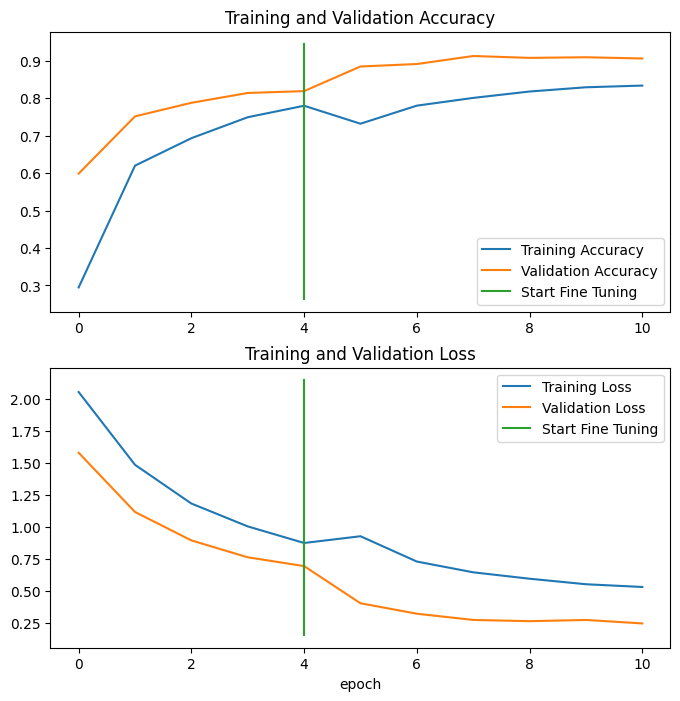

In [51]:

# How did fine-tuning go with more data?
compare_historys(original_history=history_10_percent_data_aug,
                 new_history=history_fine_10_classes_full,
                 initial_epochs=5)

In [52]:
# Load the TensorBoard extension
%load_ext tensorboard

# Launch TensorBoard pointing to your log directory
%tensorboard --logdir ./transfer_learning/

<IPython.core.display.Javascript object>